In [1]:
!date

Sat Feb  1 21:56:09 PST 2020


# TSNE on correct data

Using the Cell Ranger reference

In [1]:
import anndata
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.patches as mpatches
import scanpy as scanp
from scipy.stats import ks_2samp, ttest_ind
from scipy.sparse import csr_matrix
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import NeighborhoodComponentsAnalysis
from matplotlib import cm

import warnings
warnings.filterwarnings('ignore')

fsize=20

plt.rcParams.update({'font.size': fsize})
%config InlineBackend.figure_format = 'retina'

In [2]:
adata = "/home/sina/projects/mop/mop_SMARTseq/out_cr_index/annotated_adata.h5ad"
adata = anndata.read_h5ad(adata)

Transforming to str index.


In [3]:
def isoform2gene(adata):
    mtx = adata.X.todense()
    zero_count_mask = np.asarray(mtx.sum(axis=0)>=100)[0]
    zero_mask = np.asarray((mtx != 0).sum(axis=0)>=10)[0] # filters out isoforms that are in less than 10 cells
    
    mask = np.logical_and(zero_count_mask, zero_mask)
    # cell_mask = "nan" == adata.obs.cluster_id.values
    # print("Number of cells that do not map to a cluster: {:,}".format(cell_mask.sum()))
    # print("Filtering out this many isoforms: {:,}".format((mask).sum()))
    isoform = adata.copy()
    isoform = isoform[:, mask]
    
    #mt_mask = gene[:,gene.var["gene_name"].str.contains("Mt")].X.sum(0)
    
    isoform.var = isoform.var.reset_index(drop=True)
    genes = isoform.var.drop_duplicates("gene_id")["gene_id"].astype('str')
    gene_names = isoform.var.drop_duplicates("gene_id")["gene_name"].astype('str')
    ngenes = genes.shape[0]
    transcripts = isoform.var.transcript_id.unique().astype('str')
    ntranscripts = transcripts.shape[0]
    cells = isoform.obs.index.unique().values
    ncells = cells.shape[0]
    
    print("Number of transcripts: {:,}".format(ntranscripts))
    print("Number of genes      : {:,}".format(ngenes))
    print("Number of cells      : {:,}".format(ncells))
    
    txn_indices = isoform.var.index.values.astype(int)
    t2idx = dict(zip(transcripts, txn_indices))
    g2tidx = isoform.var.groupby("gene_id")["transcript_id"].apply(lambda x: [t2idx[i] for i in x])
    mtx = np.zeros((ncells, ngenes))
    X = isoform.X.todense()
    for idx, g in enumerate(genes):
        txns = g2tidx[g]
        sub_mtx = X[:, txns].sum(axis=1)
        mtx[:,idx] = np.asarray(sub_mtx)[:,0]
        if idx%4000 == 0:
            print(idx)
            
    var = pd.DataFrame({'gene_id':genes, "gene_name":gene_names})
    gene = anndata.AnnData(X=csr_matrix(mtx), obs=isoform.obs, var=var)
    return [isoform, gene]

In [4]:
%%time
isoform, gene = isoform2gene(adata)

Number of transcripts: 88,179
Number of genes      : 23,849
Number of cells      : 6,295
0
4000
8000
12000
16000
20000


Transforming to str index.


CPU times: user 32.9 s, sys: 5.4 s, total: 38.3 s
Wall time: 38.3 s


In [5]:
print(isoform)
print(gene)

AnnData object with n_obs × n_vars = 6295 × 88179 
    obs: 'cluster_id', 'cluster_label', 'subclass_label', 'class_label', 'cluster_color', 'size', 'cell_id'
    var: 'transcript_id', 'gene_id', 'gene_name', 'transcript_name'
AnnData object with n_obs × n_vars = 6295 × 23849 
    obs: 'cluster_id', 'cluster_label', 'subclass_label', 'class_label', 'cluster_color', 'size', 'cell_id'
    var: 'gene_id', 'gene_name'


In [6]:
gene.var.index = gene.var.gene_name.values
isoform.var.index = isoform.var.transcript_name.values

In [7]:
gene.layers["X"] = gene.X.copy()
isoform.layers["X"] = isoform.X.copy()

# Perform matrix operations

In [8]:
num_TSNE = 2
state = 42
metric = "euclidean"
n_neighbors = 30
num_PCA = 50
num_NCA = 10

# Filtering criteria
cell_threshold = 0.5e6
disp_threshold = 10

mito_criteria = 5

n_top_genes = 5000

n_bins = 20

flavor="seurat"

scale_clip = 10

### Adding info to rows/cols

In [9]:
# turning subclass_label into an id
le = LabelEncoder()
gene.obs["subclass_id"] = le.fit_transform(gene.obs.subclass_label.values)
isoform.obs["subclass_id"] = le.fit_transform(isoform.obs.subclass_label.values)

In [10]:
# turning class_label into an id
le = LabelEncoder()
gene.obs["class_id"] = le.fit_transform(gene.obs.class_label.values)
isoform.obs["class_id"] = le.fit_transform(isoform.obs.class_label.values)

In [11]:
# Adding list and number of isoforms to each gene
g2t = isoform.var.groupby("gene_id")["transcript_id"].apply(list)
gene.var["txn_list"] = gene.var["gene_id"].map(g2t)
num_iso = g2t.apply(lambda x: len(x))
gene.var["num_isoforms"] = gene.var["gene_id"].map(num_iso).astype(int)

In [12]:
# Writing cell_TPM, gene_TPM, n_genes, and percent_mito for each cell
gene.obs["cell_TPM"] = gene.X.sum(1)
gene.var["gene_TPM"] = np.asarray(gene.X.sum(0)).reshape(-1)

isoform.obs["cell_TPM"] = isoform.X.sum(1)
isoform.var["gene_TPM"] = np.asarray(isoform.X.sum(0)).reshape(-1)

mito_genes = gene.var_names.str.startswith('mt-')
gene.obs["percent_mito"] = gene[:,mito_genes].X.sum(axis=1)/gene.X.sum(axis=1)*100
gene.obs["n_genes"] = (gene.X>0).sum(axis=1)

In [13]:
# For each gene, computing the dispersion and storing it
mtx = gene.X
mean = np.asarray(mtx.mean(axis=0)).reshape(-1)
var = np.asarray(mtx.power(2).mean(axis=0)).reshape(-1) - mean**2

dispersion = var / mean

In [14]:
gene.var["dispersion"] = dispersion
gene.var["pass_disp_filter"] = gene.var["dispersion"] > disp_threshold

In [15]:
gene.obs["pass_count_filter"] = gene.obs["cell_TPM"] > cell_threshold

### Adding info to matrices

In [16]:
# gene.layers["X"] = gene.X
# isoform.layers["X"] = isoform.X

In [17]:
gene.layers["log1p"] = np.log1p(gene.X)
isoform.layers["log1p"] = np.log1p(isoform.X)

In [18]:
scanp.pp.log1p(gene)
scanp.pp.log1p(isoform)

### Filtering

In [19]:
gene.shape

(6295, 23849)

In [20]:
isoform.shape

(6295, 88179)

In [21]:
l = gene.var.txn_list[gene.var.pass_disp_filter].values
flat_list = [item for sublist in l for item in sublist]

In [22]:
gene_disp_mask = gene.var["pass_disp_filter"].values
gene_cell_mask = gene.obs["pass_count_filter"].values

iso_disp_mask = isoform.var["transcript_id"].isin(flat_list)
iso_cell_mask = gene.obs["pass_count_filter"].values

In [23]:
gene = gene[gene_cell_mask, gene_disp_mask]
isoform = isoform[iso_cell_mask, iso_disp_mask]

In [24]:
print(gene.shape)
print(isoform.shape)

(6067, 20586)
(6067, 84364)


In [25]:
mito_mask = (gene.obs.percent_mito < mito_criteria).values
gene = gene[mito_mask,:]
isoform = isoform[mito_mask,:]

In [26]:
print(gene.shape)
print(isoform.shape)

(6043, 20586)
(6043, 84364)


### Highly Variable Genes

In [27]:
scanp.pp.highly_variable_genes(gene, n_top_genes=n_top_genes, flavor=flavor, n_bins=n_bins)
hvg_mask = gene.var.highly_variable.values

Trying to set attribute `.var` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [28]:
scanp.pp.highly_variable_genes(isoform, n_top_genes=n_top_genes, flavor=flavor, n_bins=n_bins)
hvi_mask = isoform.var.highly_variable.values

Trying to set attribute `.var` of view, copying.


### Scaling data to unit variance, zero mean for clustering

In [29]:
scanp.pp.scale(gene, max_value=scale_clip)
scanp.pp.scale(isoform, max_value=scale_clip)

## **START CHECKPOINT**

In [30]:
tmp_gene = gene.copy()
tmp_isoform = isoform.copy()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [31]:
# gene = tmp_gene.copy()
# isoform = tmp_isoform.copy()

## **END CHECKPOINT**

### TSVD on highly variable genes

In [32]:
print("TSVD on {:,} variable genes to {} components.".format(n_top_genes, num_PCA))

TSVD on 5,000 variable genes to 50 components.


In [33]:
# PCA
X = gene.X[:,hvg_mask]

tsvd = TruncatedSVD(n_components=num_PCA)
gene.obsm["X_pca"] = tsvd.fit_transform(X)

X = isoform.X[:,hvi_mask]

tsvd = TruncatedSVD(n_components=num_PCA)
isoform.obsm["X_pca"] = tsvd.fit_transform(X)

### Clustering

In [34]:
scanp.pp.neighbors(gene, n_neighbors=n_neighbors, n_pcs=num_PCA, random_state=state)
scanp.pp.neighbors(isoform, n_neighbors=n_neighbors, n_pcs=num_PCA, random_state=state)

In [35]:
scanp.tl.leiden(gene, random_state=state)
scanp.tl.leiden(isoform, random_state=state)

In [36]:
scanp.tl.louvain(gene, random_state=state)
scanp.tl.louvain(isoform, random_state=state)

## Dimensionality Reduction

In [37]:
# TSNE
X = gene.obsm["X_pca"]

tsne = TSNE(n_components=num_TSNE, metric=metric, random_state=state)
gene.obsm["X_pca_tsne"] = tsne.fit_transform(X)

X = isoform.obsm["X_pca"]

tsne = TSNE(n_components=num_TSNE, metric=metric, random_state=state)
isoform.obsm["X_pca_tsne"] = tsne.fit_transform(X)

In [38]:
# NCA
X = gene.X
y = gene.obs.subclass_id.values

nca = NeighborhoodComponentsAnalysis(n_components=num_NCA,random_state=state)
gene.obsm["X_nca"] = nca.fit_transform(X, y)

In [39]:
# NCA
X = isoform.X
y = isoform.obs.subclass_id.values

nca = NeighborhoodComponentsAnalysis(n_components=num_NCA,random_state=state)
isoform.obsm["X_nca"] = nca.fit_transform(X, y)

In [40]:
X = gene.obsm["X_nca"]
tsne = TSNE(n_components=num_TSNE, metric=metric, random_state=state)
gene.obsm["X_nca_tsne"] = tsne.fit_transform(X)

In [41]:
X = isoform.obsm["X_nca"]
tsne = TSNE(n_components=num_TSNE, metric=metric, random_state=state)
isoform.obsm["X_nca_tsne"] = tsne.fit_transform(X)

## Saving

In [42]:
isoform.write("cell_ranger_annotation/isoform.h5ad")
gene.write("cell_ranger_annotation/gene.h5ad")

... storing 'gene_name' as categorical


In [355]:
gene = anndata.read_h5ad("cell_ranger_annotation/gene.h5ad")

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [45]:
isoform[:, isoform.var["gene_name"] == "Tcea1"].layers["log1p"].todense()[0:10]

matrix([[6.6174803, 2.8098001],
        [6.3252153, 0.       ],
        [5.8711314, 0.       ],
        [5.673189 , 0.       ],
        [5.3267884, 3.9817357],
        [6.252291 , 1.5436121],
        [6.2523837, 0.       ],
        [6.38416  , 0.       ],
        [5.906397 , 0.       ],
        [5.3777246, 2.2393641]], dtype=float32)

In [46]:
isoform[:, isoform.var["gene_name"] == "Tcea1"].X[0:10]

ArrayView([[ 1.0749663 ,  0.9780973 ],
           [ 0.76849633, -0.7445342 ],
           [ 0.2923424 , -0.7445342 ],
           [ 0.08477946, -0.7445342 ],
           [-0.27845752,  1.6965872 ],
           [ 0.69202787,  0.20182309],
           [ 0.69212484, -0.7445342 ],
           [ 0.83030593, -0.7445342 ],
           [ 0.32932186, -0.7445342 ],
           [-0.22504564,  0.6283746 ]], dtype=float32)

# Plotting

### TSNE on PCA components

In [119]:
print("Number of PCs: {}".format(num_PCA))

Number of PCs: 50


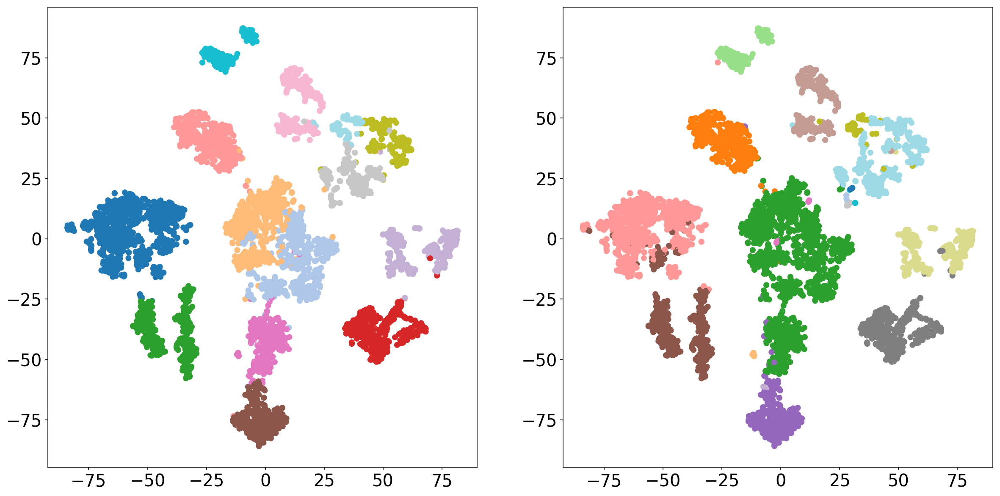

In [356]:
fig, ax = plt.subplots(figsize=(20,10), ncols=2)

x = gene.obsm["X_pca_tsne"][:,0]
y = gene.obsm["X_pca_tsne"][:,1]
c = gene.obs["louvain"].astype(int)

ax[0].scatter(x, y, c = c, cmap='tab20')

x = gene.obsm["X_pca_tsne"][:,0]
y = gene.obsm["X_pca_tsne"][:,1]
c = gene.obs["subclass_id"].astype(int)

ax[1].scatter(x, y, c = c, cmap='tab20')

plt.show()

In [357]:
adjusted_rand_score( gene.obs["louvain"].values, gene.obs["subclass_id"].values)

0.7105974414976395

### TSNE on NCA (trained on louvain)

In [358]:
print("Number of NCs: {}".format(num_NCA))

Number of NCs: 10


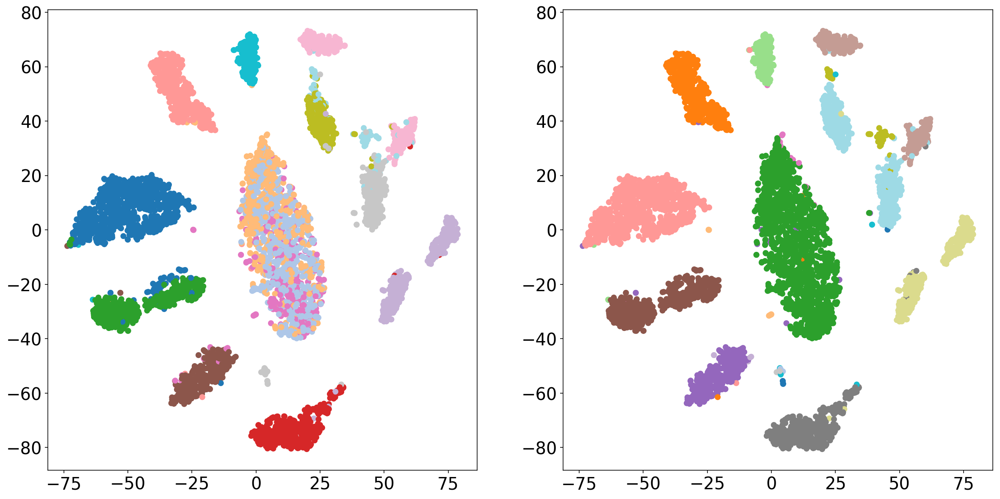

In [359]:
fig, ax = plt.subplots(figsize=(20,10), ncols=2)

x = gene.obsm["X_nca_tsne"][:,0]
y = gene.obsm["X_nca_tsne"][:,1]
c = gene.obs["louvain"].astype(int)

ax[0].scatter(x, y, c = c, cmap='tab20')

x = gene.obsm["X_nca_tsne"][:,0]
y = gene.obsm["X_nca_tsne"][:,1]
c = gene.obs["subclass_id"].astype(int)

ax[1].scatter(x, y, c = c, cmap='tab20')

plt.show()

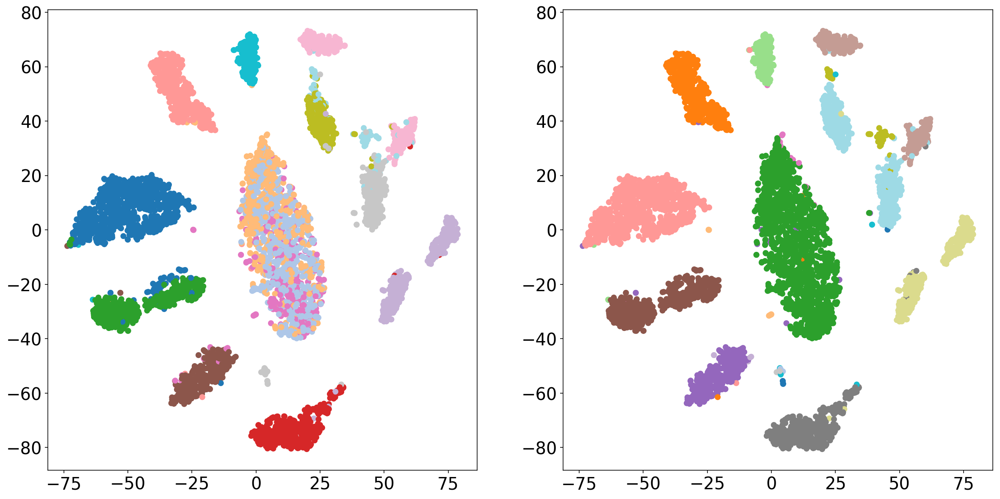

In [360]:
fig, ax = plt.subplots(figsize=(20,10), ncols=2)

x = gene.obsm["X_nca_tsne"][:,0]
y = gene.obsm["X_nca_tsne"][:,1]
c = gene.obs["louvain"].astype(int)

ax[0].scatter(x, y, c = c, cmap='tab20')

x = gene.obsm["X_nca_tsne"][:,0]
y = gene.obsm["X_nca_tsne"][:,1]
c = gene.obs["subclass_id"].astype(int)

ax[1].scatter(x, y, c = c, cmap='tab20')

plt.show()

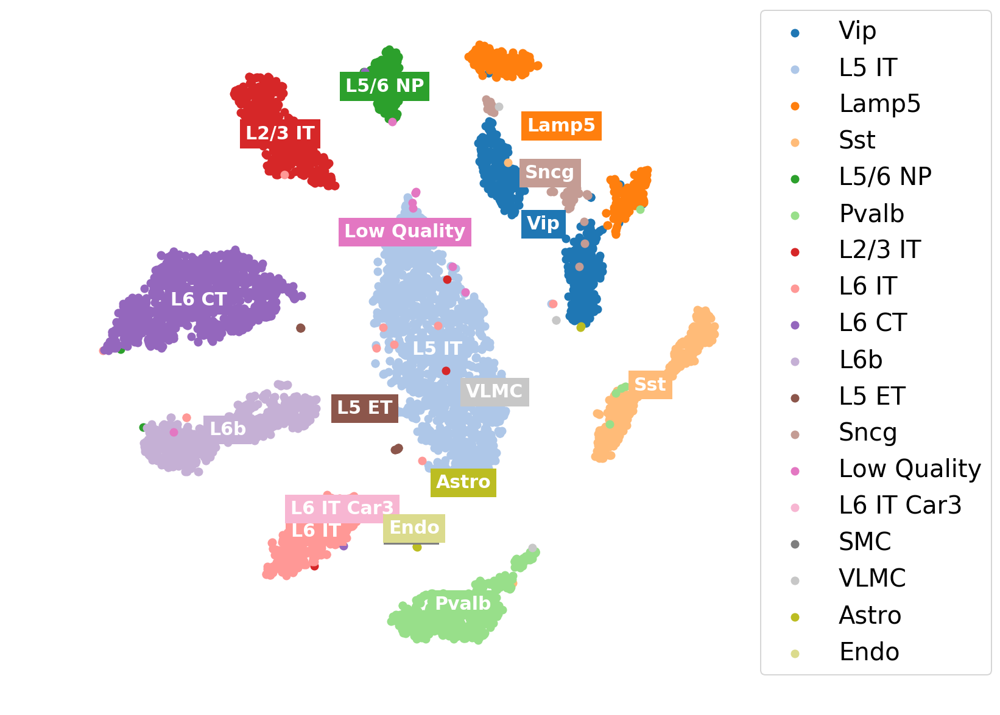

In [361]:
fig, ax = plt.subplots(figsize=(10,10))

c = gene.obs["subclass_label"].unique().astype(str)
cmap = cm.get_cmap("tab20")

for idx, cluster in enumerate(c):
    XX = gene[gene.obs.subclass_label == cluster,:].obsm["X_nca_tsne"]
    
    x = XX[:,0]
    y = XX[:,1]
    
    ax.scatter(x, y, color = cmap(idx), label=cluster)
    ax.annotate(cluster, 
             (np.mean(x), np.mean(y)),
             horizontalalignment='center',
             verticalalignment='center',
             size=15, weight='bold',
             color="white",
               backgroundcolor=cmap(idx)) 
    

ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.set_axis_off()
plt.show()

## Dimensionality Reduction

In [363]:
import random

In [369]:
random.sample(list(np.array([1, 2, 3, 4])), 4)

[2, 4, 1, 3]

In [370]:
# NCA
nca = NeighborhoodComponentsAnalysis(n_components=10,random_state=state)

X = gene.X
y = gene.obs.subclass_id.values
y = np.array(random.sample(list(y), len(y)))
XX = nca.fit_transform(X, y)

In [371]:
tsne = TSNE(n_components=num_TSNE, metric=metric, random_state=state)

X = XX
YY = tsne.fit_transform(X)

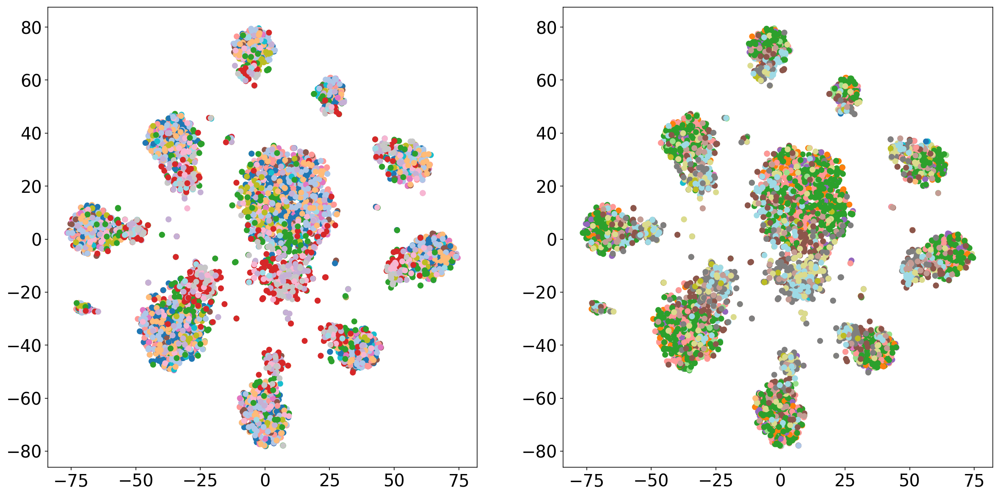

In [362]:
fig, ax = plt.subplots(figsize=(20,10), ncols=2)

x = YY[:,0]
y = YY[:,1]
c = gene.obs["louvain"].astype(int)

ax[0].scatter(x, y, c = c, cmap='tab20')

x = YY[:,0]
y = YY[:,1]
c = gene.obs["subclass_id"].astype(int)

ax[1].scatter(x, y, c = c, cmap='tab20')

plt.show()

In [70]:
tsne = TSNE(n_components=num_TSNE, metric=metric, random_state=state)

X = gene.obsm["X_nca"]
gene.obsm["X_nca_tsne"] = tsne.fit_transform(X)

In [179]:
"Tph1" in gene.var.gene_name

True

# Plotting expression of a gene

In [47]:
exp = np.asarray(gene[:, gene.var["gene_name"] == "Snrpn"].layers["log1p"].todense()).reshape(-1)

In [48]:
exp

array([8.294268 , 8.899215 , 8.1778   , ..., 7.7115355, 7.227836 ,
       7.380724 ], dtype=float32)

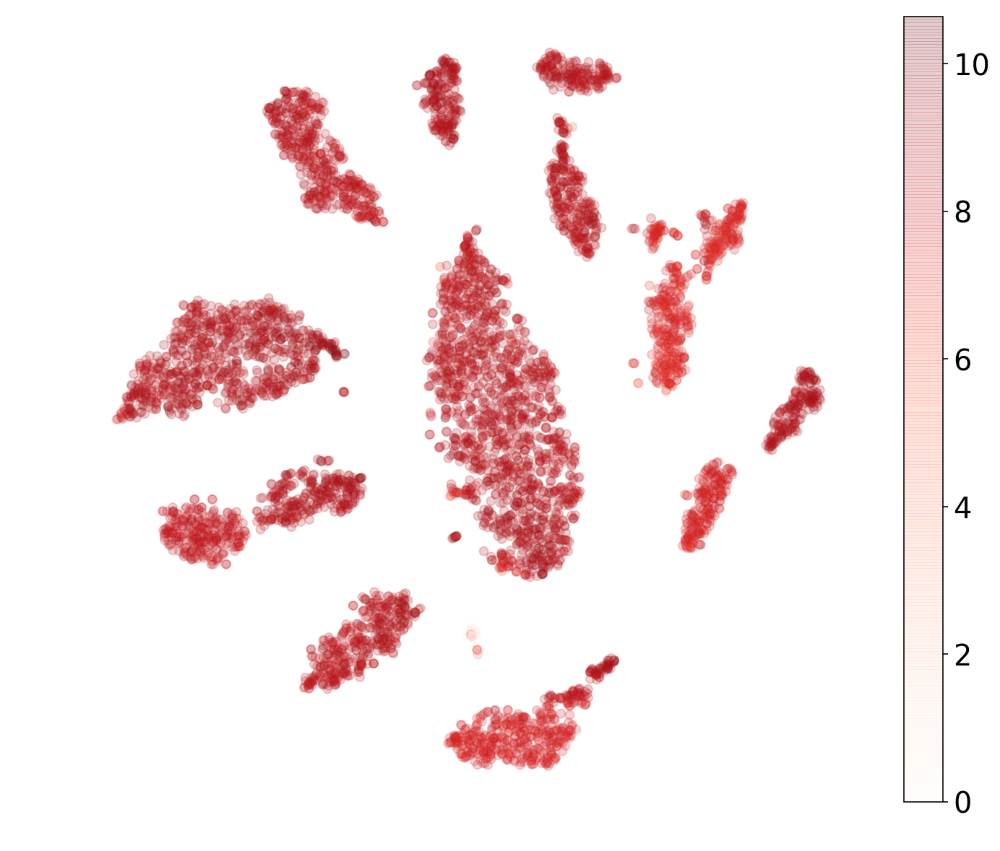

In [49]:
fig, ax = plt.subplots(figsize=(12,10))

x = gene.obsm["X_nca_tsne"][:,0]
y = gene.obsm["X_nca_tsne"][:,1]
c = gene.obs["cluster_id"]

sc = ax.scatter(x, y, c = exp, cmap='Reds', alpha=0.2)
ax.set_axis_off()
plt.colorbar(sc)

plt.show()

# Plotting expression of isoform

In [83]:
exp = np.asarray(isoform[:, isoform.var["gene_name"] == "Oxtr"].layers["log1p"].todense())

In [293]:
L1 = exp.sum(axis=1)
norm = (exp/L1[:,None])

In [294]:
norm

array([[0.        , 1.        ],
       [0.        , 1.        ],
       [0.37312016, 0.6268798 ],
       ...,
       [0.        , 1.        ],
       [       nan,        nan],
       [       nan,        nan]], dtype=float32)

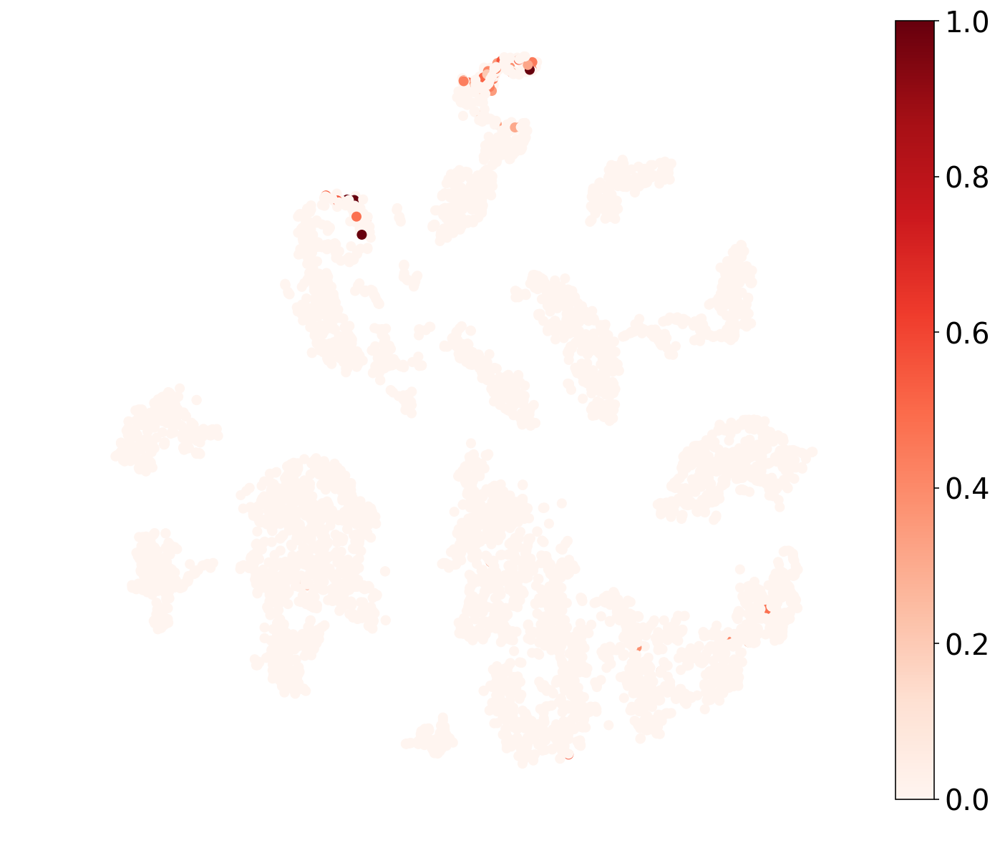

In [297]:
fig, ax = plt.subplots(figsize=(12,10))

x = gene.obsm["X_tsne"][:,0]
y = gene.obsm["X_tsne"][:,1]
c = gene.obs["cluster_id"]

sc = ax.scatter(x, y, c = norm[:,0], cmap='Reds')
ax.set_axis_off()
plt.colorbar(sc)

plt.show()

# Plotting both

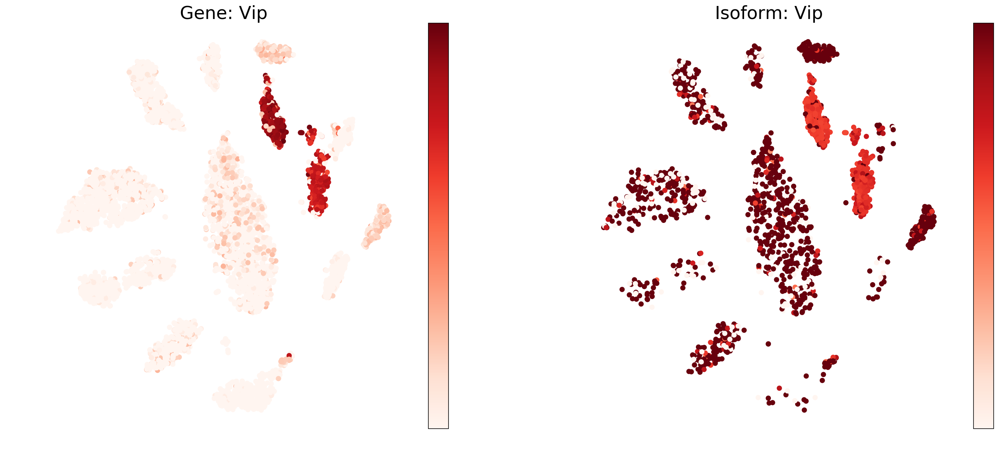

In [339]:
specific_gene = "Vip" # Slfn3 from cnum 2

gene_exp = np.asarray(gene[:, gene.var["gene_name"] == specific_gene].layers["log1p"].todense()).reshape(-1)
isof_exp = np.asarray(isoform[:, isoform.var["gene_name"] == specific_gene].layers["log1p"].todense())
L1 = isof_exp.sum(axis=1)
norm = (isof_exp/L1[:,None])
#norm[np.isnan(norm)] = -1

fig, ax = plt.subplots(figsize=(24, 10), ncols=2)

x = gene.obsm["X_nca_tsne"][:,0]
y = gene.obsm["X_nca_tsne"][:,1]
c = gene.obs["cluster_id"]

sc = ax[0].scatter(x, y, c = gene_exp, cmap='Reds')
ax[0].set_axis_off()
cbar = fig.colorbar(sc, ax=ax[0])
cbar.set_ticks([])
ax[0].set_title("Gene: "+ specific_gene)


sc = ax[1].scatter(x, y, c = norm[:,0], cmap="Reds",vmin=np.nanmin(norm[:,0]), vmax=np.nanmax(norm[:,0]))
ax[1].set_axis_off()
cbar = fig.colorbar(sc, ax=ax[1])
cbar.set_ticks([])
ax[1].set_title("Isoform: "+ specific_gene)


sc.cmap.set_bad(color='blue')



plt.show()


# Log1p Relative Expression levels

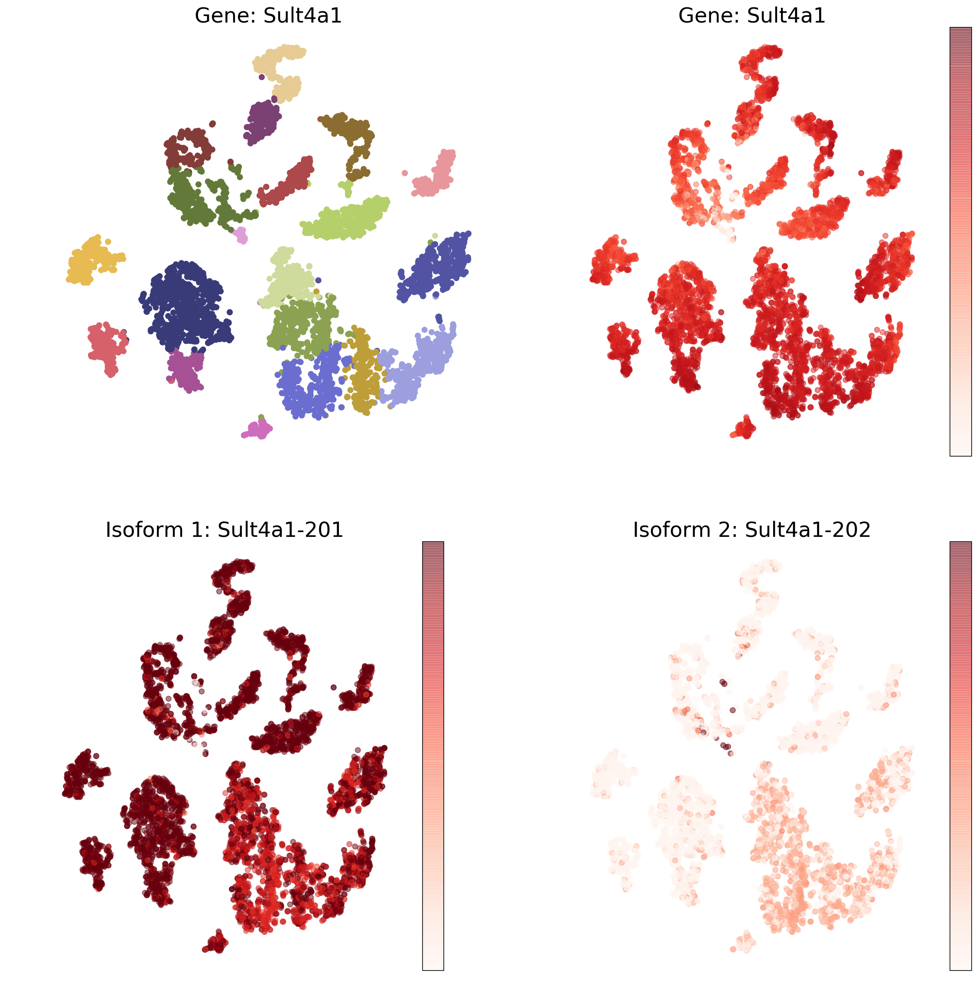

In [78]:
specific_gene = "Sult4a1" # Slfn3 from cnum 2

gene_exp = np.asarray(gene[:, gene.var["gene_name"] == specific_gene].layers["log1p"].todense()).reshape(-1)
#gene_exp = np.asarray(gene[:, gene.var["gene_name"] == specific_gene].X.todense()).reshape(-1)
isof_exp = np.asarray(isoform[:, isoform.var["gene_name"] == specific_gene].layers["log1p"].todense())
#isof_exp = np.asarray(isoform[:, isoform.var["gene_name"] == specific_gene].X.todense())

iso_1, iso_2 = isoform[:, isoform.var["gene_name"] == specific_gene].var.transcript_name.values


L1 = isof_exp.sum(axis=1)
norm = (isof_exp/L1[:,None])
#norm[np.isnan(norm)] = -1

fig, ax = plt.subplots(figsize=(20, 20), nrows=2, ncols=2)

x = gene.obsm["X_tsne"][:,0]
y = gene.obsm["X_tsne"][:,1]
c = gene.obs["leiden"].astype(int)

loc = ax[0,0]
sc = loc.scatter(x, y, c = c, cmap="tab20b")
loc.set_axis_off()
#cbar = fig.colorbar(sc, ax=ax[0])
#cbar.set_ticks([])
loc.set_title("Gene: "+ specific_gene)


loc = ax[0,1]
sc = loc.scatter(x, y, c = gene_exp, cmap='Reds', alpha=0.5)
loc.set_axis_off()
cbar = fig.colorbar(sc, ax=loc)
cbar.set_ticks([])
loc.set_title("Gene: "+ specific_gene)


loc = ax[1, 0]
c = norm[:,0]
idx = ~np.isnan(c)
sc = loc.scatter(x[idx], y[idx], c = c[idx], cmap="Reds", alpha=0.5)
loc.scatter(x[~idx], y[~idx], color="white", alpha=0)
loc.set_axis_off()
cbar = fig.colorbar(sc, ax=loc)
cbar.set_ticks([])
loc.set_title("Isoform 1: "+ iso_1)

loc = ax[1, 1]
c = norm[:,1]
idx = ~np.isnan(c)
sc = loc.scatter(x[idx], y[idx], c = c[idx], cmap="Reds", alpha=0.5)
loc.scatter(x[~idx], y[~idx], color="white", alpha=0)
loc.set_axis_off()
cbar = fig.colorbar(sc, ax=loc)
cbar.set_ticks([])
loc.set_title("Isoform 2: "+ iso_2)



plt.show()

# Log1p Absolute Expression Levels

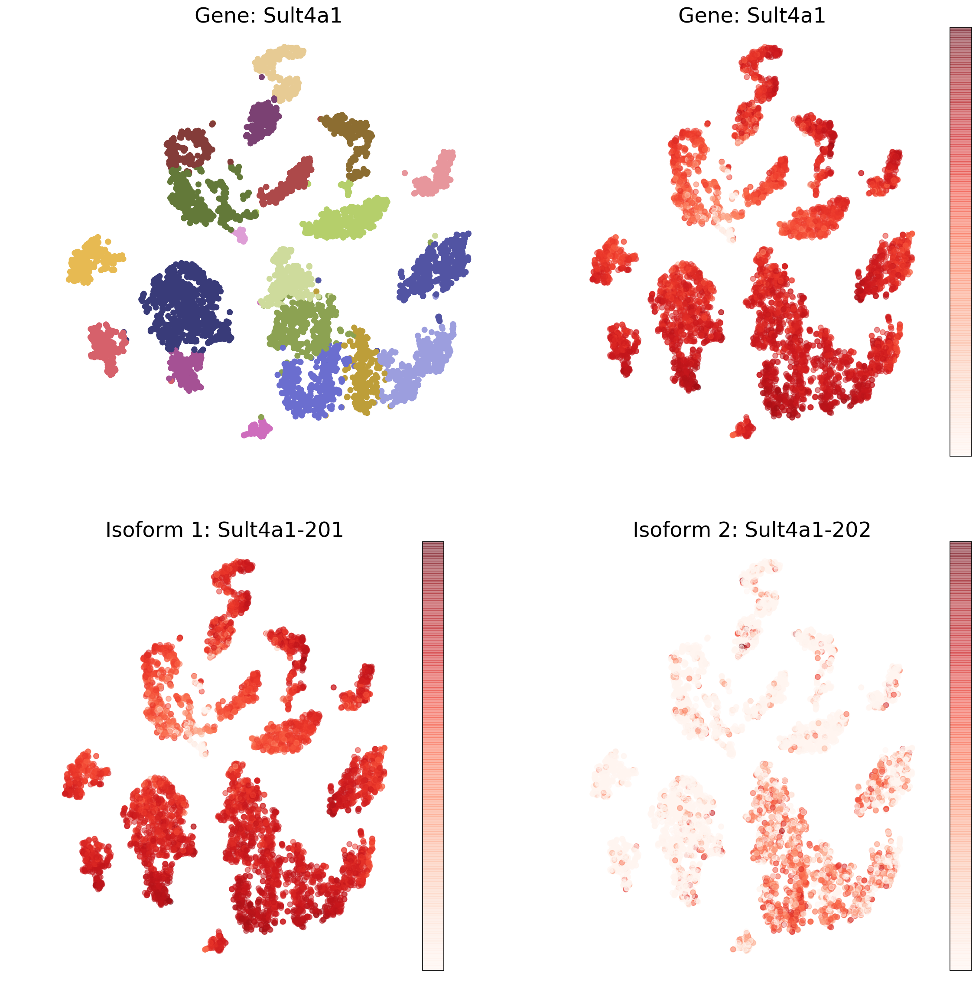

In [79]:
#specific_gene = "Oxtr" # Slfn3 from cnum 2

gene_exp = np.asarray(gene[:, gene.var["gene_name"] == specific_gene].layers["log1p"].todense()).reshape(-1)
#gene_exp = np.asarray(gene[:, gene.var["gene_name"] == specific_gene].X.todense()).reshape(-1)
isof_exp = np.asarray(isoform[:, isoform.var["gene_name"] == specific_gene].layers["log1p"].todense())
#isof_exp = np.asarray(isoform[:, isoform.var["gene_name"] == specific_gene].X.todense())


iso_1, iso_2 = isoform[:, isoform.var["gene_name"] == specific_gene].var.transcript_name.values

#norm[np.isnan(norm)] = -1

fig, ax = plt.subplots(figsize=(20, 20), nrows = 2, ncols=2)

x = gene.obsm["X_tsne"][:,0]
y = gene.obsm["X_tsne"][:,1]
c = gene.obs["leiden"].astype(int)


loc = ax[0,0]
sc = loc.scatter(x, y, c = c, cmap='tab20b')
loc.set_axis_off()
loc.set_title("Gene: "+ specific_gene)


loc=ax[0,1]
sc = loc.scatter(x, y, c = gene_exp, cmap='Reds', alpha=0.5)
loc.set_axis_off()
cbar = fig.colorbar(sc, ax=loc)
cbar.set_ticks([])
loc.set_title("Gene: "+ specific_gene)


loc=ax[1, 0]
sc = loc.scatter(x, y, c = isof_exp[:,0], cmap="Reds", alpha=0.5)
loc.set_axis_off()
cbar = fig.colorbar(sc, ax=loc)
cbar.set_ticks([])
loc.set_title("Isoform 1: "+ iso_1)



loc=ax[1,1]
sc = loc.scatter(x, y, c = isof_exp[:,1], cmap="Reds", alpha=0.5)

loc.set_axis_off()
cbar = fig.colorbar(sc, ax=loc)
cbar.set_ticks([])
loc.set_title("Isoform 2: "+ iso_2)



plt.show()

# Absolute and relative plotting combined

In [55]:
(gene.obs["subclass_label"] == str(cidx)).sum()

0

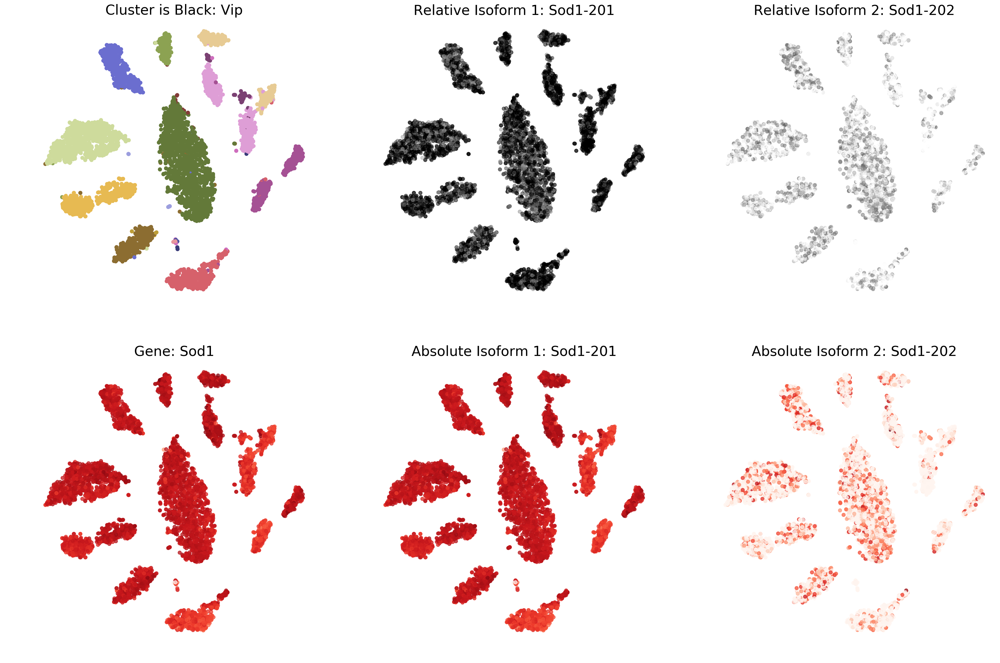

In [72]:
specific_gene = "Sod1" # Slfn3 from cnum 2
cidx ="Vip"

gene_exp = np.asarray(gene[:, gene.var["gene_name"] == specific_gene].layers["log1p"].todense()).reshape(-1)
#gene_exp = np.asarray(gene[:, gene.var["gene_name"] == specific_gene].X.todense()).reshape(-1)
isof_exp = np.asarray(isoform[:, isoform.var["gene_name"] == specific_gene].layers["log1p"].todense())
#isof_exp = np.asarray(isoform[:, isoform.var["gene_name"] == specific_gene].X.todense())

iso_1, iso_2 = isoform[:, isoform.var["gene_name"] == specific_gene].var.transcript_name.values


L1 = isof_exp.sum(axis=1)
norm = (isof_exp/L1[:,None])
#norm[np.isnan(norm)] = -1

fig, ax = plt.subplots(figsize=(30, 20), nrows=2, ncols=3)

x = gene.obsm["X_nca_tsne"][:,0]
y = gene.obsm["X_nca_tsne"][:,1]
c = gene.obs["subclass_id"].astype(int)
#cells = gene.obs["subclass_label"] == str(cidx)

loc = ax[0,0]
sc = loc.scatter(x, y, c = c, cmap="tab20b")
loc.set_axis_off()
#cbar = fig.colorbar(sc, ax=ax[0])
#cbar.set_ticks([])
loc.set_title("Cluster is Black: "+ str(cidx))

# Relative
loc = ax[0, 1]
c = norm[:,0]
idx = ~np.isnan(c)
sc = loc.scatter(x[idx], y[idx], c = c[idx], cmap="binary", alpha=0.5)
loc.scatter(x[~idx], y[~idx], color="white", alpha=0)
loc.set_axis_off()
# cbar = fig.colorbar(sc, ax=loc)
# cbar.set_ticks([])
loc.set_title("Relative Isoform 1: "+ iso_1)

loc = ax[0, 2]
c = norm[:,1]
idx = ~np.isnan(c)
sc = loc.scatter(x[idx], y[idx], c = c[idx], cmap="binary", alpha=0.5)
loc.scatter(x[~idx], y[~idx], color="white", alpha=0)
loc.set_axis_off()
# cbar = fig.colorbar(sc, ax=loc)
# cbar.set_ticks([])
loc.set_title("Relative Isoform 2: "+ iso_2)



cmap = "Reds"
# Gene Expression
loc = ax[1,0]
sc = loc.scatter(x, y, c = gene_exp, cmap=cmap, alpha=0.75)
loc.set_axis_off()
#cbar = fig.colorbar(sc, ax=loc, pad=0)
#cbar.set_ticks([])
loc.set_title("Gene: "+ specific_gene)


## Absolute
loc=ax[1, 1]
sc = loc.scatter(x, y, c = isof_exp[:,0], cmap=cmap, alpha=0.75)
loc.set_axis_off()
#cbar = fig.colorbar(sc, ax=loc, pad=0)
#cbar.set_ticks([])
loc.set_title("Absolute Isoform 1: "+ iso_1)



loc=ax[1,2]
sc = loc.scatter(x, y, c = isof_exp[:,1], cmap=cmap, alpha=0.75)

loc.set_axis_off()
#cbar = fig.colorbar(sc, ax=loc, pad=0)
#cbar.set_ticks([])
loc.set_title("Absolute Isoform 2: "+ iso_2)



plt.show()

In [238]:
gene.var

,gene_id,gene_name,highly_variable,means,dispersions,dispersions_norm
0,ENSMUSG00000051951,Xkr4,False,2.915583,4.434698,-0.027659
3,ENSMUSG00000089699,Gm1992,False,0.494716,2.402766,-0.339306
4,ENSMUSG00000102343,Gm37381,False,0.767217,2.355870,-0.763044
6,ENSMUSG00000025900,Rp1,False,0.089008,4.022442,0.899679
7,ENSMUSG00000025902,Sox17,False,0.219182,5.509072,2.036889
...,...,...,...,...,...,...
88173,ENSMUSG00000096237,CT868723.1,False,1.639882,3.535690,-0.661082
88174,ENSMUSG00000079808,AC168977.1,False,1.339415,1.780467,-1.582690
88175,ENSMUSG00000095041,AC149090.1,False,5.608115,5.601230,1.059597
88177,ENSMUSG00000063897,CAAA01118383.1,False,2.281539,3.281312,-1.268060


# Looping through and making all the plots

In [374]:
top_genes = np.array(['Gm17018', 'Galnt15', 'Slfn3', 'Myh8', 'Rnf152', 'Oxtr', 'Cgref1',
       'Cgref1', 'Itgb3', 'B230209E15Rik', 'Clic4', 'Rasl10a', 'Snrpn',
       'Snrpn', 'Polb', 'Cd163', 'Plcxd3', 'Pde3a', 'A330049N07Rik',
       'Gm39456', 'Galnt15', 'Ndnf', 'Snrpn', 'Myh8', 'Prdm8', 'Sparcl1',
       None, 'C530043A13Rik', 'Slc15a5', 'Prdm8', 'Wwtr1', 'Mmp14', None,
       'Maf', None, 'Maf', 'Pik3cg', 'Pcsk2', 'Ppp2ca', 'B230209E15Rik',
       'Tacr1', 'Sar1b', 'Pcsk2', None, 'Krt26', 'Clic1', 'Vegfd',
       'Brd3os', 'C530043A13Rik', 'Morc1', 'Tacr1', None, None, None,
       'Clic4', 'C130073E24Rik', 'Gpr149', 'Ube2d2a', 'Sh2d4a', None,
       None, None], dtype=object)

clusters = np.array(['Vip Chat_1', 'L5 IT S100b_2', 'Lamp5 Slc35d3', 'Sst Myh8_2',
       'L5 NP Slc17a8', 'Sst Etv1', 'L5 IT Rspo1', 'L5 IT Rspo2',
       'L5 IT S100b_1', 'Vip Htr1f', 'Pvalb Reln', 'L5 IT Tcap_1',
       'Vip Chat_2', 'Vip Igfbp6', 'Lamp5 Egln3_1', 'L2/3 IT Macc1',
       'L2/3 IT S100a6', 'Vip Crispld2', 'Vip C1ql1', 'L2/3 IT Cdh13 Sla',
       'L6 IT Sulf_1', 'Lamp5 Pdlim5', 'Vip Chat_3', 'Sst Myh8_1',
       'L6 IT Sulf_3', 'L5 IT Tcap_2', 'Astro Aqp4', 'L6 CT Grp_1',
       'L6 NP Trh', 'L6 CT Nxph2_1', 'L6b Shisa6', 'L6b Ror1_1', 'L5 ET',
       'Sst Crhr2_1', 'Pvalb Vipr2', 'Sst C1ql3', 'Sncg', 'Sst Crhr2_2',
       'Vip Gpc3', 'Vip Serpinf1', 'Lamp5 Lhx6', 'Vip Lmo1', 'Pvalb Th',
       'L5 IT Tcap_low', 'L6 CT Gpr139', 'L6b Rprm', 'L6 IT Sulf_2',
       'L5 IT Pld5', 'L6 CT Grp_2', 'Lamp5 Egln3_2', 'Sst Chodl',
       'L6 CT Nxph2_2', 'Sncg Slc17a8', 'L6 IT Car3', 'Pvalb Calb1',
       'L6b Ror1_2', 'Pvalb Gpr149', 'SMC Aoc3', 'L6b Kcnip1_1',
       'L6b Kcnip1_2', 'VLMC', 'Endo Slc38a5'], dtype=object)

In [156]:
top_genes = np.array([np.array(['Map4k3', 'Ccar2', 'Nom1', 'Arf1', 'Sult4a1'], dtype='<U13'),
       np.array(['Fbxl7', 'Rasgrp3', 'Gm10389', 'Eomes', 'Sh2d4a'], dtype='<U13'),
       np.array(['Trex1', 'Asic2', 'Tmem14a', 'Gm32647', 'Gng13'], dtype='<U13'),
       np.array(['Cenpw', 'Ppp1r14a', 'Atp6v0e', 'Abhd2', 'Gpr39'], dtype='<U13'),
       np.array(['Bmp2k', 'Kank2', 'Tst', 'Flt3', 'Clic4'], dtype='<U13'),
       np.array(['Cd163', 'Thrsp', 'Vmn1r47', 'Kctd1', 'Plcxd3'], dtype='<U13'),
       np.array(['D030056L22Rik', 'Tmed7', 'Arl8b', 'Vsnl1', 'Tomm20'], dtype='<U13'),
       np.array(['Tmed7', 'Atp6v0e', 'Kifap3', 'Maip1', 'Snrpn'], dtype='<U13'),
       np.array(['Rtl4', 'Ckm', 'Nxnl2', 'Fkbp1b', 'Sult4a1'], dtype='<U13'),
       np.array(['Vmn1r76', 'Fam19a5', 'Zfp804a', 'Casz1', 'Plcxd3'], dtype='<U13'),
       np.array(['C530043A13Rik', 'Igf1os', 'BC001981', 'Emp2', 'Slitrk2'],
      dtype='<U13'),
       np.array(['Gm26569', 'Kifap3', 'B230209E15Rik', 'Sult4a1', 'Arhgdia'],
      dtype='<U13'),
       np.array(['Gm45470', 'Gnal', 'Acbd3', 'Rilpl2', 'Slc1a6'], dtype='<U13'),
       np.array(['Rtl4', 'Vmn1r76', 'Usp31', 'Olfr575', 'Gm13387'], dtype='<U13'),
       np.array(['Mob3b', 'Casz1', 'Slfn4', 'Pdgfrl', 'Cckbr'], dtype='<U13'),
       np.array(['Gm4707', 'Scara5', 'A330008L17Rik', 'Gm36816', 'Rtl4'],
      dtype='<U13'),
       np.array(['Gm32647', 'Maf', 'Clic4', 'Chodl', 'Olfr324'], dtype='<U13'),
       np.array(['Pip4k2c', 'Plcl1', 'Fez2', 'Slc6a20b', 'Gm9803'], dtype='<U13'),
       np.array(['Txlnb', 'Vegfd', 'Inhba', 'Galnt15', 'Osr1'], dtype='<U13'),
       np.array(['Fam19a5', 'Gm13522', 'Eif4ebp1', 'Morc1', 'Mmp14'], dtype='<U13')],
      dtype=object)

clusters = np.array(['11', '9', '8', '15', '5', '2', '18', '16', '1', '3', '4', '7',
       '0', '17', '10', '14', '13', '19', '6', '12'], dtype=object)

# Relative expression

In [130]:
clusters

array(['11', '9', '8', '15', '5', '2', '18', '16', '1', '3', '4', '7',
       '0', '17', '10', '14', '13', '19', '6', '12'], dtype=object)

In [157]:
%%time
for cidx, c_label in enumerate(clusters):
    print(cidx, c_label)
    for gidx, specific_gene in enumerate(top_genes[cidx]):
        if specific_gene is not None:
            cluster_label = c_label
            #print(gidx, cluster_label)
    
            #specific_gene = "Sult4a1" # Slfn3 from cnum 2
            #cluster_label = clusters[i].replace("/", "_")
            
            gene_exp = np.asarray(gene[:, gene.var["gene_name"] == specific_gene].layers["log1p"].todense()).reshape(-1)
            isof_exp = np.asarray(isoform[:, isoform.var["gene_name"] == specific_gene].layers["log1p"].todense())
            
            iso_1, iso_2 = isoform[:, isoform.var["gene_name"] == specific_gene].var.transcript_name.values
            
            
            L1 = isof_exp.sum(axis=1)
            norm = (isof_exp/L1[:,None])
            
            fig, ax = plt.subplots(figsize=(30, 20), nrows=2, ncols=3)
            
            x = gene.obsm["X_tsne"][:,0]
            y = gene.obsm["X_tsne"][:,1]
            # c = gene.obs["leiden"].astype(int)
            c = (gene.obs["leiden"] == cluster_label)
            
            loc = ax[0,0]
            sc = loc.scatter(x, y, c = c, cmap="nipy_spectral_r")
            loc.set_axis_off()
            #cbar = fig.colorbar(sc, ax=ax[0])
            #cbar.set_ticks([])
            loc.set_title("Cluster is Black: "+ cluster_label)
            
            # Relative
            loc = ax[0, 1]
            c = norm[:,0]
            idx = ~np.isnan(c)
            sc = loc.scatter(x[idx], y[idx], c = c[idx], cmap="binary", alpha=0.5)
            loc.scatter(x[~idx], y[~idx], color="white", alpha=0)
            loc.set_axis_off()
            # cbar = fig.colorbar(sc, ax=loc)
            # cbar.set_ticks([])
            loc.set_title("Relative Isoform 1: "+ iso_1)
            
            loc = ax[0, 2]
            c = norm[:,1]
            idx = ~np.isnan(c)
            sc = loc.scatter(x[idx], y[idx], c = c[idx], cmap="binary", alpha=0.5)
            loc.scatter(x[~idx], y[~idx], color="white", alpha=0)
            loc.set_axis_off()
            # cbar = fig.colorbar(sc, ax=loc)
            # cbar.set_ticks([])
            loc.set_title("Relative Isoform 2: "+ iso_2)
            
            cmap = "Reds"
            # Gene Expression
            loc = ax[1,0]
            sc = loc.scatter(x, y, c = gene_exp, cmap=cmap, alpha=0.5)
            loc.set_axis_off()
            cbar = fig.colorbar(sc, ax=loc, pad=0)
            #cbar.set_ticks([])
            loc.set_title("Gene: "+ specific_gene)
            
            
            ## Absolute
            loc=ax[1, 1]
            sc = loc.scatter(x, y, c = isof_exp[:,0], cmap=cmap, alpha=0.5)
            loc.set_axis_off()
            cbar = fig.colorbar(sc, ax=loc, pad=0)
            #cbar.set_ticks([])
            loc.set_title("Absolute Isoform 1: "+ iso_1)
            
            
            
            loc=ax[1,2]
            sc = loc.scatter(x, y, c = isof_exp[:,1], cmap=cmap, alpha=0.5)
            
            loc.set_axis_off()
            cbar = fig.colorbar(sc, ax=loc, pad=0)
            #cbar.set_ticks([])
            loc.set_title("Absolute Isoform 2: "+ iso_2)
    
            plt.savefig("de_novo_cluster_analysis/top_5_genes_isoforms/{}-{}_{}.png".format(cluster_label, specific_gene, gidx))
            plt.close()

0 11
1 9
2 8
3 15
4 5
5 2
6 18
7 16
8 1
9 3
10 4
11 7
12 0
13 17
14 10
15 14
16 13
17 19
18 6
19 12
CPU times: user 4min 44s, sys: 48.1 s, total: 5min 32s
Wall time: 3min 59s


In [153]:
top_genes

array(['Rpl32', 'Pnoc', 'Lrrc75b', 'Ddn', 'Lamtor5', 'Scarb2', 'Sparcl1',
       '1110019B22Rik', 'Thumpd1', 'Frg1', 'Platr4', 'Prr15', 'Adm',
       'Rnf152', 'Dbpht2', 'Acnat1', 'Fkbp1b', 'Arf1', '6330403L08Rik',
       'Acbd3'], dtype=object)

# Just to show I am not crazy lets look at gene specific markers and plot those

In [142]:
top_genes = np.array(['Rpl32', 'Pnoc', 'Lrrc75b', 'Ddn', 'Lamtor5', 'Scarb2', 'Sparcl1',
       '1110019B22Rik', 'Thumpd1', 'Frg1', 'Platr4', 'Prr15', 'Adm',
       'Rnf152', 'Dbpht2', 'Acnat1', 'Fkbp1b', 'Arf1', '6330403L08Rik',
       'Acbd3'], dtype=object)

clusters = np.array(['11', '9', '8', '15', '5', '2', '18', '16', '1', '3', '4', '7',
       '0', '17', '10', '14', '13', '19', '6', '12'], dtype=object)

In [144]:
%%time
for gidx, specific_gene in enumerate(top_genes):
    if specific_gene is not None:
        cluster_label = clusters[gidx]
        print(gidx, cluster_label)

        #specific_gene = "Sult4a1" # Slfn3 from cnum 2
        #cluster_label = clusters[i].replace("/", "_")
        
        gene_exp = np.asarray(gene[:, gene.var["gene_name"] == specific_gene].layers["log1p"].todense()).reshape(-1)
        isof_exp = np.asarray(isoform[:, isoform.var["gene_name"] == specific_gene].layers["log1p"].todense())
        
        iso_1, iso_2 = isoform[:, isoform.var["gene_name"] == specific_gene].var.transcript_name.values
        
        
        L1 = isof_exp.sum(axis=1)
        norm = (isof_exp/L1[:,None])
        
        fig, ax = plt.subplots(figsize=(30, 20), nrows=2, ncols=3)
        
        x = gene.obsm["X_tsne"][:,0]
        y = gene.obsm["X_tsne"][:,1]
        # c = gene.obs["leiden"].astype(int)
        c = (gene.obs["leiden"] == cluster_label)
        
        loc = ax[0,0]
        sc = loc.scatter(x, y, c = c, cmap="nipy_spectral_r")
        loc.set_axis_off()
        #cbar = fig.colorbar(sc, ax=ax[0])
        #cbar.set_ticks([])
        loc.set_title("Cluster is Black: "+ cluster_label)
        
        # Relative
        loc = ax[0, 1]
        c = norm[:,0]
        idx = ~np.isnan(c)
        sc = loc.scatter(x[idx], y[idx], c = c[idx], cmap="binary", alpha=0.5)
        loc.scatter(x[~idx], y[~idx], color="white", alpha=0)
        loc.set_axis_off()
        # cbar = fig.colorbar(sc, ax=loc)
        # cbar.set_ticks([])
        loc.set_title("Relative Isoform 1: "+ iso_1)
        
        loc = ax[0, 2]
        c = norm[:,1]
        idx = ~np.isnan(c)
        sc = loc.scatter(x[idx], y[idx], c = c[idx], cmap="binary", alpha=0.5)
        loc.scatter(x[~idx], y[~idx], color="white", alpha=0)
        loc.set_axis_off()
        # cbar = fig.colorbar(sc, ax=loc)
        # cbar.set_ticks([])
        loc.set_title("Relative Isoform 2: "+ iso_2)
        
        cmap = "Reds"
        # Gene Expression
        loc = ax[1,0]
        sc = loc.scatter(x, y, c = gene_exp, cmap=cmap, alpha=0.5)
        loc.set_axis_off()
        cbar = fig.colorbar(sc, ax=loc, pad=0)
        #cbar.set_ticks([])
        loc.set_title("Gene: "+ specific_gene)
        
        
        ## Absolute
        loc=ax[1, 1]
        sc = loc.scatter(x, y, c = isof_exp[:,0], cmap=cmap, alpha=0.5)
        loc.set_axis_off()
        cbar = fig.colorbar(sc, ax=loc, pad=0)
        #cbar.set_ticks([])
        loc.set_title("Absolute Isoform 1: "+ iso_1)
        
        
        
        loc=ax[1,2]
        sc = loc.scatter(x, y, c = isof_exp[:,1], cmap=cmap, alpha=0.5)
        
        loc.set_axis_off()
        cbar = fig.colorbar(sc, ax=loc, pad=0)
        #cbar.set_ticks([])
        loc.set_title("Absolute Isoform 2: "+ iso_2)

        plt.savefig("de_novo_cluster_analysis/genes_only/{}-{}.png".format(cluster_label, specific_gene))
        plt.close()

0 11
1 9
2 8
3 15
4 5
5 2
6 18
7 16
8 1
9 3
10 4
11 7
12 0
13 17
14 10
15 14
16 13
17 19
18 6
19 12
CPU times: user 58.4 s, sys: 9.6 s, total: 1min 8s
Wall time: 49.4 s


# Absolute expression

In [71]:
%%time
for i, specific_gene in enumerate(top_genes):
    if specific_gene is not None:
        cluster_label = clusters[i].replace("/", "_")
        
        #gene_exp = np.asarray(gene[:, gene.var["gene_name"] == specific_gene].layers["log1p"].todense()).reshape(-1)
        gene_exp = np.asarray(gene[:, gene.var["gene_name"] == specific_gene].X.todense()).reshape(-1)
        #isof_exp = np.asarray(isoform[:, isoform.var["gene_name"] == specific_gene].layers["log1p"].todense())
        isof_exp = np.asarray(isoform[:, isoform.var["gene_name"] == specific_gene].X.todense())
        
        iso_1, iso_2 = isoform[:, isoform.var["gene_name"] == specific_gene].var.transcript_name.values

        #norm[np.isnan(norm)] = -1
        
        fig, ax = plt.subplots(figsize=(36, 10), ncols=3)
        
        x = gene.obsm["X_tsne"][:,0]
        y = gene.obsm["X_tsne"][:,1]
        c = gene.obs["cluster_id"]
        
        sc = ax[0].scatter(x, y, c = gene_exp, cmap='Reds')
        ax[0].set_axis_off()
        cbar = fig.colorbar(sc, ax=ax[0])
        cbar.set_ticks([])
        ax[0].set_title("Gene: "+ specific_gene)
        
        
        
        sc = ax[1].scatter(x, y, c = isof_exp[:,0], cmap="Reds")
        ax[1].set_axis_off()
        cbar = fig.colorbar(sc, ax=ax[1])
        cbar.set_ticks([])
        ax[1].set_title("Isoform 1: "+ iso_1)
        
        
        sc = ax[2].scatter(x, y, c = isof_exp[:,1], cmap="Reds")
        
        ax[2].set_axis_off()
        cbar = fig.colorbar(sc, ax=ax[2])
        cbar.set_ticks([])
        ax[2].set_title("Isoform 2: "+ iso_2)
        
        
        
        plt.savefig("de_novo_cluster_analysis/absolute/{}-{}.png".format(cluster_label, specific_gene))
        plt.close()

CPU times: user 37.2 s, sys: 7.78 s, total: 45 s
Wall time: 30.1 s


# Own clustering results

In [394]:
gene

AnnData object with n_obs × n_vars = 6295 × 23849 
    obs: 'cluster_id', 'cluster_label', 'subclass_label', 'class_label', 'cluster_color', 'size', 'cell_id'
    var: 'gene_id', 'gene_name'
    obsm: 'X_pca', 'TSVD10', 'X_tsne'
    layers: 'log1p'

In [405]:
sc.pp.neighbors(gene, n_neighbors=30, n_pcs=num_comp, random_state=state)

# Leiden clustering

In [406]:
%%time
scanp.tl.leiden(gene, random_state=state)

CPU times: user 1.41 s, sys: 15.9 ms, total: 1.43 s
Wall time: 1.43 s


In [409]:
gene.obs.leiden.nunique()

19

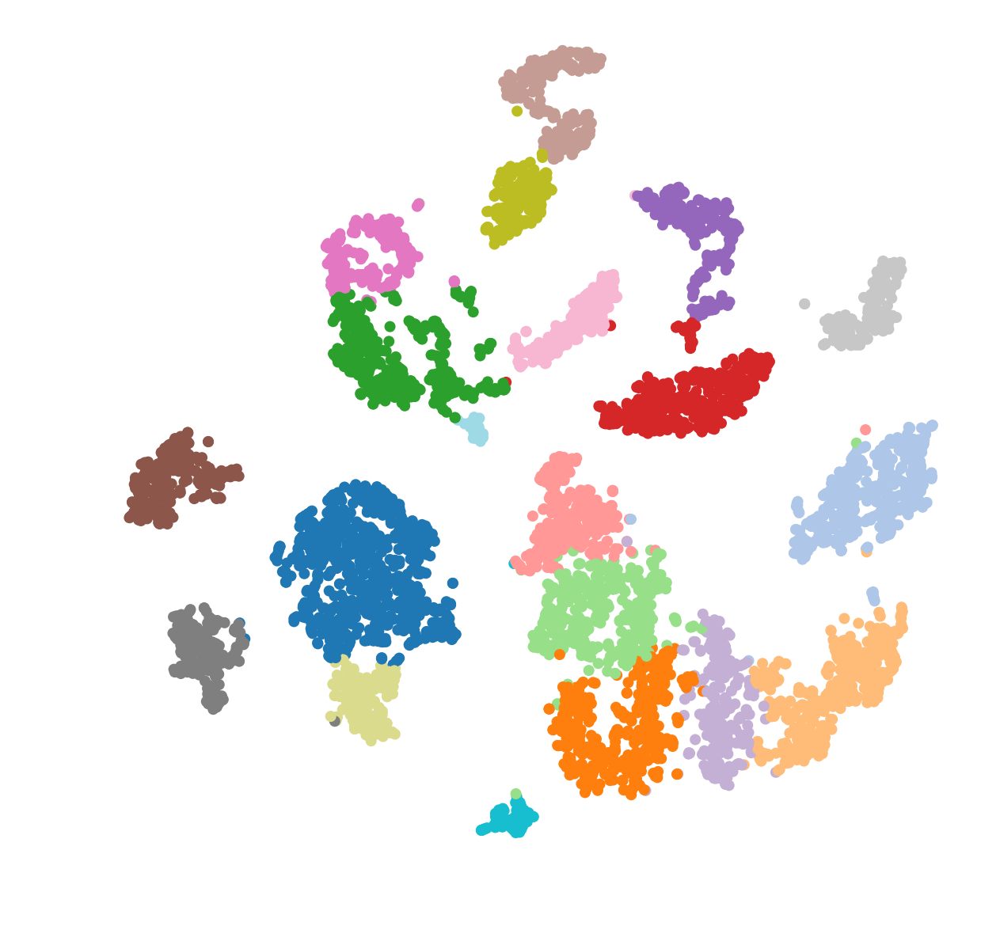

In [19]:
fig, ax = plt.subplots(figsize=(10,10))

x = gene.obsm["X_tsne"][:,0]
y = gene.obsm["X_tsne"][:,1]
c = gene.obs["leiden"].astype(int)

ax.scatter(x, y, c = c, cmap='tab20')
ax.set_axis_off()

plt.show()

# Louvain clustering

In [414]:
%%time
scanp.tl.louvain(gene, random_state=state)

CPU times: user 970 ms, sys: 3.93 ms, total: 974 ms
Wall time: 972 ms


In [415]:
gene.obs.leiden.nunique()

19

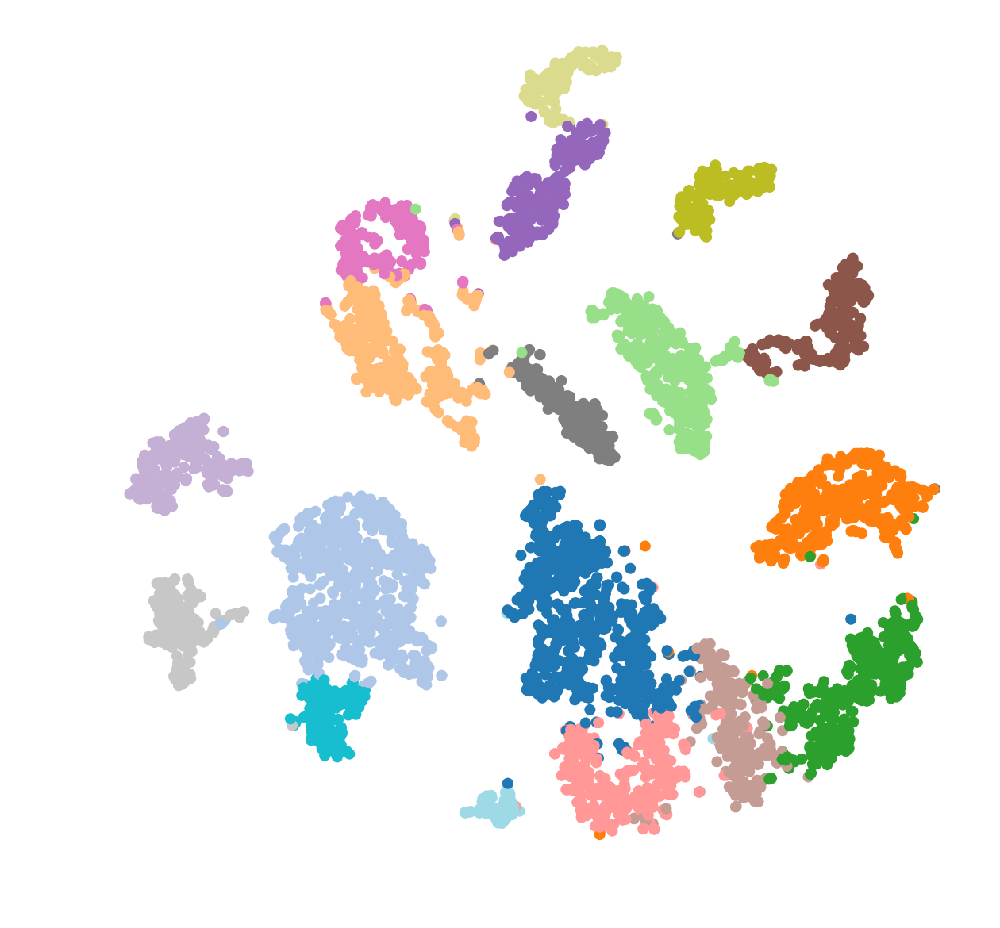

In [416]:
fig, ax = plt.subplots(figsize=(10,10))

x = gene.obsm["X_tsne"][:,0]
y = gene.obsm["X_tsne"][:,1]
c = gene.obs["louvain"].astype(int)

ax.scatter(x, y, c = c, cmap='tab20')
ax.set_axis_off()

plt.show()

In [417]:
umap = UMAP(n_neighbors=n_neighbors, metric=metric, random_state=state)
gene.obsm["X_umap"] = umap.fit_transform(gene.obsm["TSVD10"])

In [423]:
n_types = 61
kmeans = KMeans(n_clusters=n_types, random_state=state)
kmeans.fit(gene.X)
c = kmeans.labels_

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/home/sina/bin/miniconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3319, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-423-b621ad8521ce>", line 3, in <module>
    kmeans.fit(gene.X)
  File "/home/sina/bin/miniconda3/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py", line 937, in fit
    x_squared_norms=x_squared_norms, random_state=seed)
  File "/home/sina/bin/miniconda3/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py", line 409, in _kmeans_single_lloyd
    x_squared_norms=x_squared_norms)
  File "/home/sina/bin/miniconda3/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py", line 626, in _init_centroids
    x_squared_norms=x_squared_norms)
  File "/home/sina/bin/miniconda3/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py", line 116, in _k_init
    X[candidate_ids], X, Y_norm_squared=x_squared_norms, squared=True)
  File "/home/sina/bin/miniconda3/lib/p

KeyboardInterrupt: 

In [ ]:
fig, ax = plt.subplots(figsize=(10,10))

x = gene.obsm["X_tsne"][:,0]
y = gene.obsm["X_tsne"][:,1]
#c = gene.obs["louvain"].astype(int)

ax.scatter(x, y, c = c, cmap='tab20')
ax.set_axis_off()

plt.show()

In [424]:
gene

AnnData object with n_obs × n_vars = 6295 × 23849 
    obs: 'cluster_id', 'cluster_label', 'subclass_label', 'class_label', 'cluster_color', 'size', 'cell_id', 'leiden', 'louvain'
    var: 'gene_id', 'gene_name'
    uns: 'neighbors', 'leiden', 'louvain'
    obsm: 'X_pca', 'TSVD10', 'X_tsne', 'X_umap'
    layers: 'log1p'

In [425]:
gene.var

,gene_id,gene_name
0,ENSMUSG00000051951,Xkr4
3,ENSMUSG00000089699,Gm1992
4,ENSMUSG00000102343,Gm37381
6,ENSMUSG00000025900,Rp1
7,ENSMUSG00000025902,Sox17
...,...,...
88173,ENSMUSG00000096237,CT868723.1
88174,ENSMUSG00000079808,AC168977.1
88175,ENSMUSG00000095041,AC149090.1
88177,ENSMUSG00000063897,CAAA01118383.1


In [426]:
adata

AnnData object with n_obs × n_vars = 6295 × 111079 
    obs: 'cluster_id', 'cluster_label', 'subclass_label', 'class_label', 'cluster_color', 'size', 'cell_id'
    var: 'transcript_id', 'gene_id', 'gene_name', 'transcript_name'

In [160]:
clusters

array(['11', '9', '8', '15', '5', '2', '18', '16', '1', '3', '4', '7',
       '0', '17', '10', '14', '13', '19', '6', '12'], dtype=object)

In [162]:
gene

AnnData object with n_obs × n_vars = 6295 × 23849 
    obs: 'cluster_id', 'cluster_label', 'subclass_label', 'class_label', 'cluster_color', 'size', 'cell_id', 'leiden', 'louvain'
    var: 'gene_id', 'gene_name'
    uns: 'neighbors', 'leiden', 'louvain'
    obsm: 'X_pca', 'X_tsne'
    layers: 'log1p'

In [159]:
isoform.obs

,cluster_id,cluster_label,subclass_label,class_label,cluster_color,size,cell_id,leiden,louvain
0,10,Vip Chat_1,Vip,GABAergic,#FF00FF,33,LS-15395_S47_E1-50,16,10
1,38,L5 IT S100b_2,L5 IT,Glutamatergic,#2F8C4D,83,LS-15395_S48_E1-50,7,2
2,4,Lamp5 Slc35d3,Lamp5,GABAergic,#FFA388,194,LS-15395_S49_E1-50,10,9
3,38,L5 IT S100b_2,L5 IT,Glutamatergic,#2F8C4D,83,LS-15395_S50_E1-50,7,2
4,20,Sst Myh8_2,Sst,GABAergic,#D27A2A,55,LS-15395_S51_E1-50,8,8
...,...,...,...,...,...,...,...,...,...
6575,25,Pvalb Reln,Pvalb,GABAergic,#BC2D71,292,SM-GE935_S380_E1-50,5,4
6576,7,Sncg,Sncg,GABAergic,#9900B3,77,SM-GE935_S381_E1-50,12,11
6577,16,Vip Gpc3,Vip,GABAergic,#B94DA7,43,SM-GE935_S382_E1-50,4,3
6578,12,Vip Chat_3,Vip,GABAergic,#FF0CFF,87,SM-GE935_S383_E1-50,4,3


# Standard Gene Expression Cluster Assignment

Fucking rediculous that this shit requires a certain structure

In [230]:
scanp.pp.highly_variable_genes(gene, n_top_genes=100)

In [231]:
gene

AnnData object with n_obs × n_vars = 6295 × 23849 
    obs: 'cluster_id', 'cluster_label', 'subclass_label', 'class_label', 'cluster_color', 'size', 'cell_id', 'leiden', 'louvain'
    var: 'gene_id', 'gene_name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'leiden', 'louvain', 'neighbors', 'log1p'
    obsm: 'X_pca', 'X_tsne'
    layers: 'log1p'

In [233]:
gene.var[gene.var["highly_variable"] == True]

,gene_id,gene_name,highly_variable,means,dispersions,dispersions_norm
1678,ENSMUSG00000061816,Myl1,True,2.389918,7.979158,4.362016
1760,ENSMUSG00000039323,Igfbp2,True,2.710937,9.821224,8.185714
2245,ENSMUSG00000036766,Dner,True,5.709307,7.200580,4.327985
3076,ENSMUSG00000026344,Lypd1,True,4.581846,7.088931,5.132110
4472,ENSMUSG00000026678,Rgs5,True,3.619787,9.018360,8.006622
...,...,...,...,...,...,...
82824,ENSMUSG00000013766,Ly6g6e,True,4.024844,6.619955,4.444036
84003,ENSMUSG00000024048,Myl12a,True,3.906367,6.710579,4.644048
85929,ENSMUSG00000041607,Mbp,True,3.922888,7.140919,5.593825
87354,ENSMUSG00000035783,Acta2,True,3.627902,10.067647,9.885949


Want to implement this but for isoform switches, return the sets of genes whos isoform switches are highly variable

Then from that we want to look for the genes with highly variable isoform switches but not highly variable genes

This will give us a set of genes who;s isoforms are interesting